# Neural Style Transfer 


## Environment configuration

In [0]:
# import packages
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import time
import os
img_dir = '/tmp/nst'
if not os.path.exists(img_dir):
  os.makedirs(img_dir)
from tensorflow.keras.preprocessing.image import load_img

In [0]:
# upgrade to tensorflow 2.0
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
print("TF version: ",tf.__version__)

TF version:  2.0.0


In [0]:
#make sure all following functions are callable 
tf.executing_eagerly()

True

In [0]:
# Check GPU
tf.config.experimental.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

## Load Images

Use 3 content images and 2 style images from website to realize the style transfer:

content 1: a photo of hamberger

content 2: a photo of a haski  

content 3: Leonardo Da Vinci's portrait 

style 1: A little girl in a Japanese animation

style 2: A Painting of a mountain

In [0]:
# content 1 A Sandwich
!wget --quiet -P /tmp/nst/ "https://www.abeautifulplate.com/wp-content/uploads/2018/05/everything-bagel-sandwich-1-5-720x720.jpg"
# content 2 Haski
!wget --quiet -P /tmp/nst/ "https://previews.123rf.com/images/roppix/roppix1404/roppix140400027/27583914-dog-sibirskiy-haski.jpg" 
# content 3 Leonardo Da Vinci
!wget --quiet -P /tmp/nst/ "http://www.leonardodavinci.net/images/leonardo-da-vinci.jpg"
# style 1 A little girl in a Japanese animation
!wget --quiet -P /tmp/nst/ "https://static.bangkokpost.com/media/content/20190410/c1_1659432_190410121247.jpg" 
# style 2 A Painting of a mountain
!wget --quiet -P /tmp/nst/ "https://www.sciencenews.org/wp-content/uploads/2019/02/021419_JR_okeefe_feat.jpg"

In [0]:
content1_path = '/tmp/nst/everything-bagel-sandwich-1-5-720x720.jpg'
content2_path = '/tmp/nst/27583914-dog-sibirskiy-haski.jpg'
content3_path = '/tmp/nst/leonardo-da-vinci.jpg'
style1_path = '/tmp/nst/c1_1659432_190410121247.jpg'
style2_path = '/tmp/nst/021419_JR_okeefe_feat.jpg'
content1 = load_img(content1_path, target_size=(224, 224))
content2 = load_img(content2_path, target_size=(224, 224))
content3 = load_img(content3_path, target_size=(224, 224))
style1 = load_img(style1_path, target_size=(224, 224))
style2 = load_img(style2_path, target_size=(224, 224))

Following are the content images and style images

Text(0.5, 1.0, 'style2')

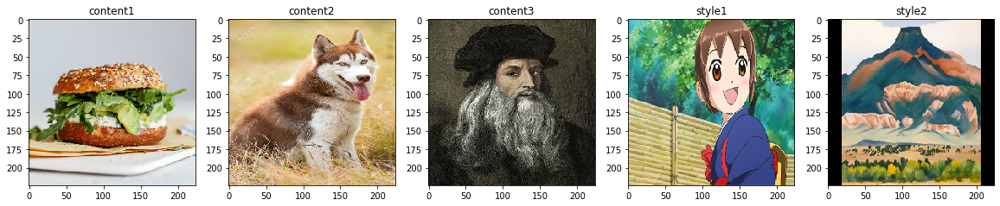

In [0]:
plt.figure(figsize=(20,20))

plt.subplot(1,5,1)
plt.imshow(content1)
plt.title('content1')

plt.subplot(1,5,2)
plt.imshow(content2)
plt.title('content2')

plt.subplot(1,5,3)
plt.imshow(content3)
plt.title('content3')

plt.subplot(1,5,4)
plt.imshow(style1)
plt.title('style1')

plt.subplot(1,5,5)
plt.imshow(style2)
plt.title('style2')


## Data Preparation

The input format for VGG19 is already created in a function `tf.keras.applications.vgg19.preprocess_input`. Simply apply this function on the raw image data. The input of the network should be an tensor with shape [1, 224, 224, 3].

In [0]:
def load_img(path_to_img):
  '''
  read a image into array
  '''
  # Give a limitation to the image display
  dim_limitation = 512
  img = Image.open(path_to_img)
  long = max(img.size)
  scale = dim_limitation/long
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  
  img = tf.keras.preprocessing.image.img_to_array(img)
  
  # We need to broadcast the image array such that it has a batch dimension 
  img = np.expand_dims(img, axis=0)
  return img

In [0]:
def process_img(path_to_img):
  ''' process a image to match input of VGG19'''
  img = load_img(path_to_img)
  img = tf.keras.applications.vgg19.preprocess_input(img) 
  return img

VGG model is based on image data that is normalized by mean = [103.939, 116.779, 123.68] and with channels BGR. Transform the output data back to the form that is valid for visualization.

In [0]:
def deprocess_img(processed_img):
  '''return deprocessed image'''
  x = processed_img.copy()
  if len(x.shape) == 4:
    # when dimension of x is 4[1,height,width, channel], delete the first dimension
    x = np.squeeze(x, 0)
  if len(x.shape) != 3:
    raise ValueError("Invalid input")
  
  # add mean back to pixels
  mean=[103.939,116.779,123.68]
  for i in range(3):
    x[:,:,i]+=mean[i]

  x = x[:, :, ::-1]

  # clip to maintain our values from within the 0-255 range.
  x = np.clip(x, 0, 255).astype('uint8') 
  return x

# Define content and style layers

Select block5_conv2 as a layer for content; block1_conv1, block2_conv1, block3_conv1, block4_conv1, block5_conv1 for style layers.

In [0]:
# Content layer chosen to construct content representation
content_layers = ['block5_conv2'] 

# Style layer chosen
style_layers = ['block1_conv1','block2_conv1','block3_conv1', 'block4_conv1', 'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

# Build The Model Function

Build two models that will output the content layer and style layers from VGG19.

In [0]:
def get_style_model():
  """ With VGG19 model, the function returns a keras 
  model that takes image inputs and outputs the style layers for loss function. 
  """
  # Load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  #set vgg parameter untrainable
  vgg.trainable = False
  # Get style output layers
  outputs = [vgg.get_layer(layer).output for layer in style_layers]
  #return model
  return tf.keras.models.Model(vgg.input, outputs)

def get_content_model():
  """ similar with get_style_model"""
  # Load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  #set vgg parameter untrainable
  vgg.trainable = False
  # Get style output layers
  outputs = [vgg.get_layer(layer).output for layer in content_layers]
  #return model
  return tf.keras.models.Model(vgg.input, outputs)

## Computing loss and loss gradient

In [0]:
def get_content_loss(content, target):
  '''compute content loss function'''
  return tf.reduce_mean(tf.square(content - target))

In [0]:
def gram_matrix(layer_feature):
  '''Gram_matrix is used in get_style_loss.
  calculate the feature correlations by gram matrix
  layer_feature: feature maps in  layer l
  '''
  channels = layer_feature.get_shape().as_list()[-1] 
  mat = tf.reshape(layer_feature, [-1, channels]) 
  n = tf.shape(mat)[0] 
  gram = tf.matmul(mat, mat, transpose_a=True)
  gram = gram / tf.cast(n, tf.float32)
  return gram

In [0]:
def get_style_loss(base_style, gram_target):
  """
  calculate the contribution of one layer to the total style loss
  base_style: feature maps in layer l
  gram_target: gram matrix for the generated image
  """
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  E = tf.reduce_mean(tf.square(gram_style - gram_target))
  return E

In [0]:
def get_feature_representations(style_model,content_model,content, style):
  """
  return representation features of style and content, they are list of lists
  """
  # Load images
  content_image = process_img(content)
  style_image = process_img(style)
  
  # compute content and style features
  style_outputs = style_model(style_image)
  content_outputs = content_model(content_image)
  
  
  # Get the style and content feature representations from our model  
  style_features = [style_layer[0] for style_layer in style_outputs]
  if len(content_layers)>1:
    content_features = [content_layer[0] for content_layer in content_outputs]
  else:
    content_features = content_outputs
  return style_features, content_features

In [0]:
def compute_loss(style_model,content_model,loss_weights, init_image,\
                 gram_style_features, content_features):
  """Compute total loss
  paramerter:
    loss_weights: (style weight, content weight)
    init_image: Our initial base image. Gradients are applied on this image. 
    gram_style_features: Precomputed gram matrices corresponding to the 
      defined style layers of interest.
    content_features: Precomputed outputs from defined content layers of 
      interest.
      
  Result:
    returns the total loss, style loss, content loss
  """
  style_weight, content_weight = loss_weights
  
  # Feed init image into our model and get the representation of content and style

  style_output_features = style_model(init_image)
  content_output_features = content_model(init_image)
  
  style_score = 0
  content_score = 0

  # Accumulate style losses from all layers
  # Here, we equally weight each contribution of each loss layer
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
  # Accumulate content losses from all layers 
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content, target_content)
  
  style_score *= style_weight
  content_score *= content_weight

  # Get total loss
  loss = style_score + content_score 
  return loss, style_score, content_score

In [0]:
def compute_grads(cfg):
  '''compute gradients for total loss'''
  with tf.GradientTape() as tape: 
    all_loss = compute_loss(**cfg)

  # Compute gradients wrt input image
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

## NST (Neural Style Transfer)

Run the optimization functions above to give a gradient descent loop.

In [0]:
import IPython.display
import random

def run_style_transfer(content, 
                       style,
                       num_iterations=1000,
                       content_weight=1e4, 
                       style_weight=1e-2,
                       init_image_content=True): 
  '''
  content: picture path of content picture
  style: picture path of style picture
  num_iterations: times of iterations
  content_weight: alpha in the Leon thesis
  style_weight: beta in the Leon thesis
  init_image_content: True -- the iteration starts from content image;
                      False -- starts from white noise image
  '''
  # Set VGG layer parameter untrainable
  style_model = get_style_model() 
  content_model=get_content_model()
  for layer in style_model.layers:
    layer.trainable = False
  for layer in content_model.layers:
    layer.trainable = False
  
  # Get the style and content feature representations
  style_features, content_features = get_feature_representations(style_model, content_model, content, style)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
  # Set initial image
  if init_image_content==True: # content
    init_image = process_img(content)
    init_image = tf.Variable(init_image, dtype=tf.float32)
  elif init_image_content==False: # white noise
    init_image_size = process_img(content).shape
    row = init_image_size[1]
    col = init_image_size[2]
    init_image = np.zeros((1, row, col, 3))
    for i in range(row):
      for j in range(col):
        for k in range(3):
          init_image[0,i,j,k]=init_image[0,i,j,k]+random.gauss(0,1)   # Add some Gaussian Noise to the blank image
    init_image = tf.Variable(init_image, dtype=tf.float32)

  # Create the optimizer
  opt = tf.keras.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=1e-1)

  # For displaying intermediate images 
  iter_count = 1
  
  # Store our best result
  best_loss, best_img = float('inf'), None
  
  # Create a nice config 
  loss_weights = (style_weight, content_weight)
  
  cfg = {
      'style_model':style_model,
      'content_model':content_model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features
  }
    
  # For displaying
  num_rows = 2
  num_cols = 5
  display_interval = num_iterations/(num_rows*num_cols)
  start_time = time.time()
  global_start = time.time()
  
  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means   
  
  imgs = []

  # record the changing process of loss
  loss_list = [] 
  style_score_list = []
  content_score_list = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time() 

    loss_list.append(loss.numpy())
    style_score_list.append(style_score.numpy())
    content_score_list.append(content_score.numpy())
    
    if loss < best_loss:
      # Update best loss and best image from total loss. 
      best_loss = loss
      best_img = deprocess_img(init_image.numpy())

    if i % display_interval== 0:
      start_time = time.time()
      
      # Use the .numpy() method to get the concrete numpy array
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img)
      imgs.append(plot_img)
      IPython.display.clear_output(wait=True)
      IPython.display.display_png(Image.fromarray(plot_img))
      print('Iteration: {}'.format(i))        
      print('Total loss: {:.4e}, ' 
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
  print('Total time: {:.4f}s'.format(time.time() - global_start))
  IPython.display.clear_output(wait=True)
  plt.figure(figsize=(14,4))
  for i,img in enumerate(imgs):
      plt.subplot(num_rows,num_cols,i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])

  plt.figure(figsize=(16,5))
  # plot the loss changing process before 50th iteration
  plt.subplot(1,2,1)
  plt.plot(loss_list[:50], label='total loss')  
  plt.plot(style_score_list[:50], label='style loss')
  plt.plot(content_score_list[:50], label='content loss')
  plt.title('Loss Changing Process BEFORE 50th Iteration')
  plt.xlabel('iteration')
  plt.ylabel('loss')
  plt.legend()

  # plot the loss changing process after 50th iteration
  plt.subplot(1,2,2)
  plt.plot(loss_list[50:], label='total loss')  
  plt.plot(style_score_list[51:], label='style loss')
  plt.plot(content_score_list[51:], label='content loss')
  plt.title('Loss Changing Process AFTER 50th Iteration')
  plt.xlabel('iteration')
  plt.ylabel('loss')
  plt.legend()
      
  return best_img, best_loss 

## Show the results

In [0]:
def imshow(img, title=None):
  # Remove the batch dimension
  out = np.squeeze(img, axis=0)
  # Normalize for display 
  out = out.astype('uint8')
  plt.imshow(out)
  if title is not None:
    plt.title(title)
  plt.imshow(out)

In [0]:
def show_results(best_img, content_path, style_path, show_large_final=True):
  plt.figure(figsize=(10, 5))
  content = load_img(content_path) 
  style = load_img(style_path)

  plt.subplot(1, 2, 1)
  imshow(content, 'Content Image')

  plt.subplot(1, 2, 2)
  imshow(style, 'Style Image')

  if show_large_final: 
    plt.figure(figsize=(10, 10))

    plt.imshow(best_img)
    plt.title('Output Image')
    plt.show()

# Test the algorithm on Content1-Style1

- Initial Image is the content image
- content weight: 10,000
- style weight: 0.01
- iterations: 1000

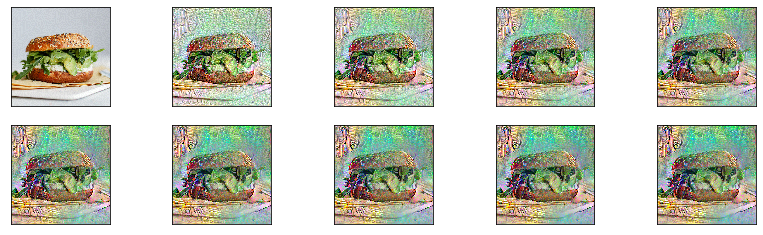

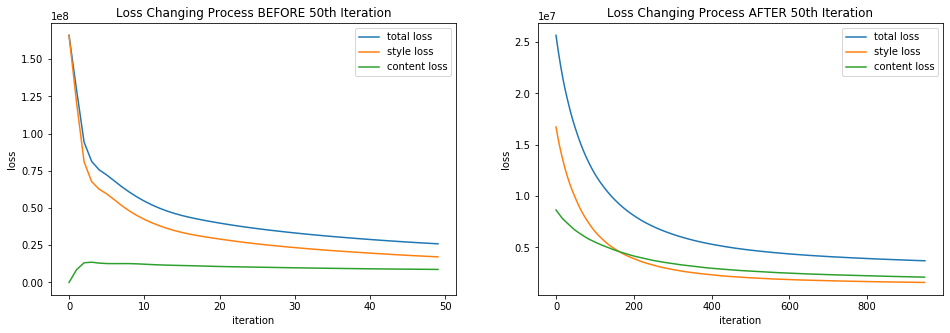

In [0]:
random.seed(2019)
best11, best_loss11 = run_style_transfer(content1_path, style1_path, content_weight=1e4, style_weight = 1e-2,
                                         init_image_content=True, num_iterations=1000)

In [0]:
best_loss11

<tf.Tensor: id=3032738, shape=(), dtype=float32, numpy=3704238.0>

Visualize the results

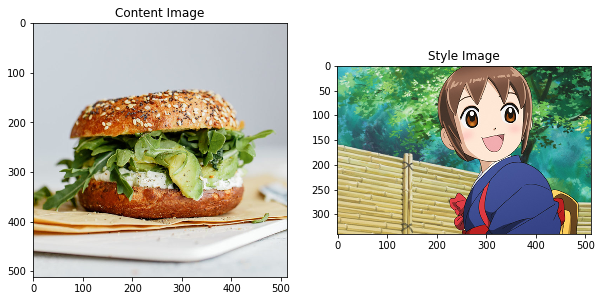

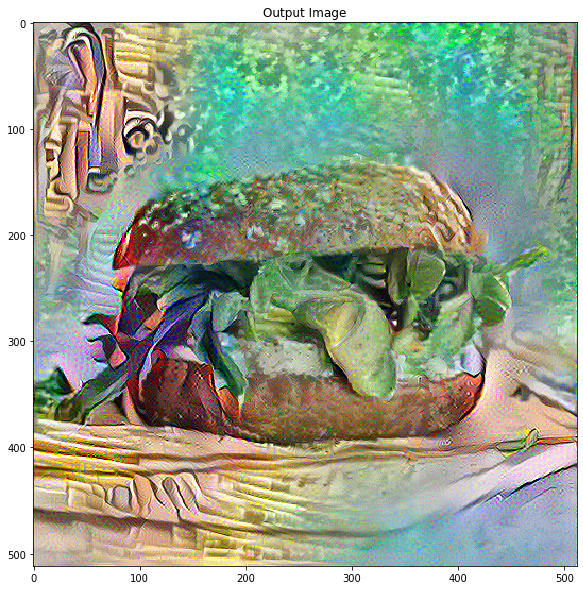

In [0]:
show_results(best11, content1_path, style1_path)

# Test the algorithm on Content1-Style2

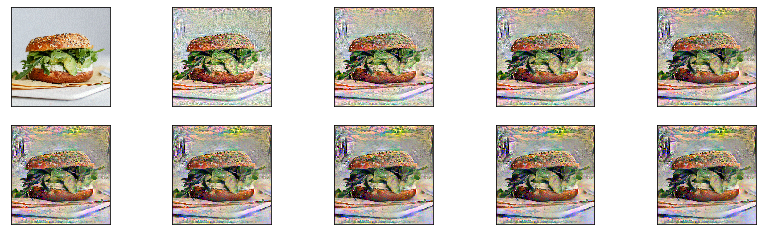

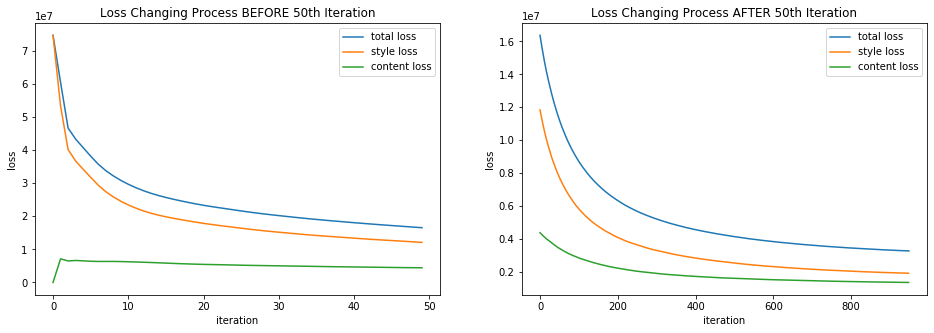

In [0]:
random.seed(2019)
best12, best_loss12 = run_style_transfer(content1_path, style2_path, content_weight=1e4, style_weight = 1e-2,
                                         init_image_content=True, num_iterations=1000)

In [0]:
best_loss12

<tf.Tensor: id=3683112, shape=(), dtype=float32, numpy=3269000.8>

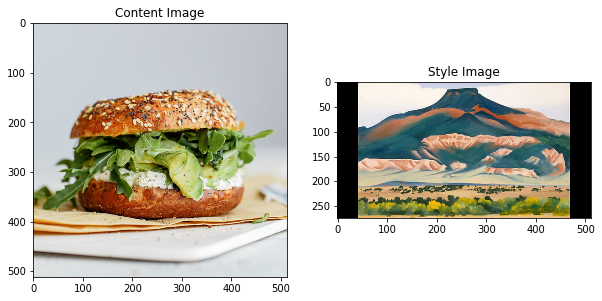

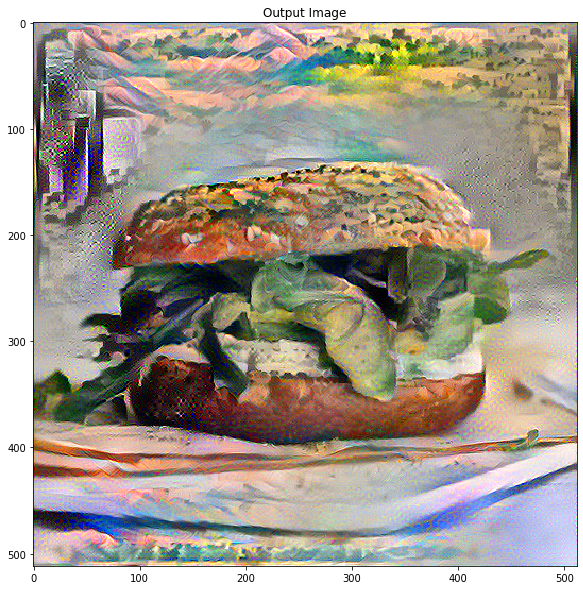

In [0]:
show_results(best12, content1_path, style2_path)

# Test the algorithm on Content2-Style1

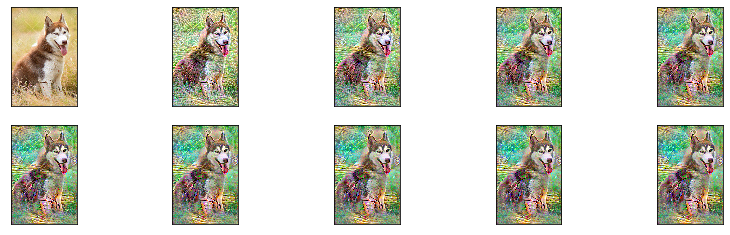

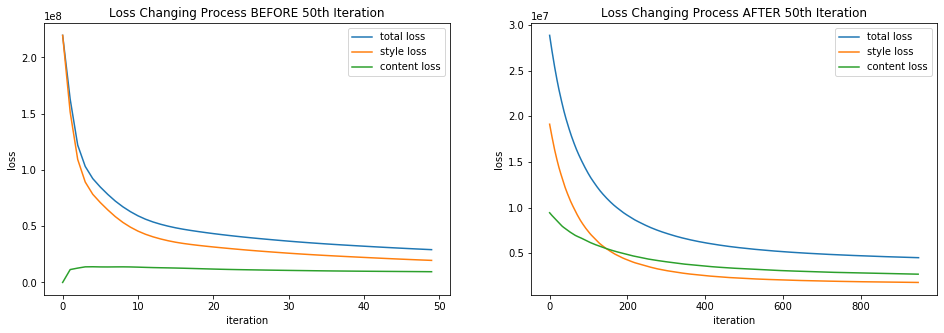

In [0]:
random.seed(2019)
best21, best_loss21 = run_style_transfer(content2_path, style1_path, content_weight=1e4, style_weight = 1e-2,
                                         init_image_content=True, num_iterations=1000)

In [0]:
best_loss21

<tf.Tensor: id=4333486, shape=(), dtype=float32, numpy=4513997.0>

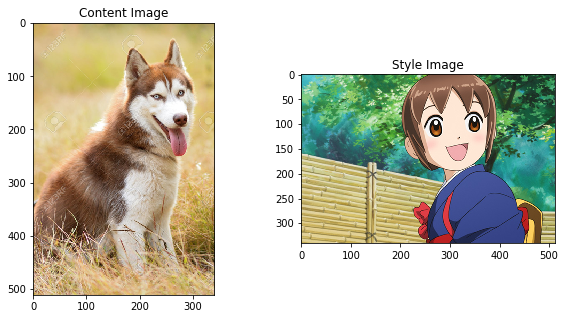

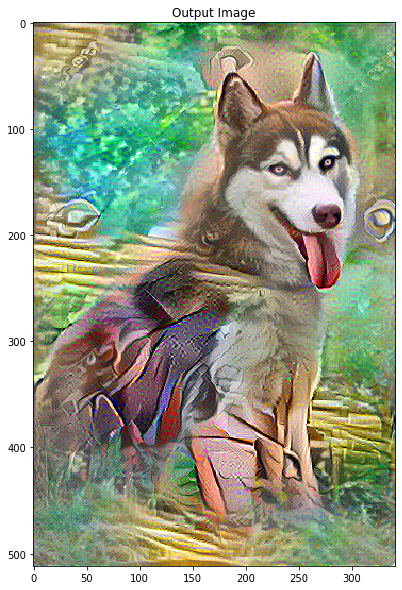

In [0]:
show_results(best21, content2_path, style1_path)

# Test the algorithm on Content2-Style2

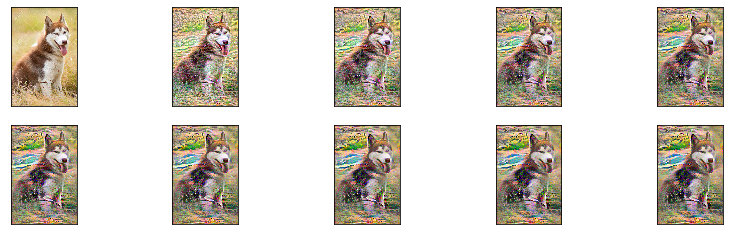

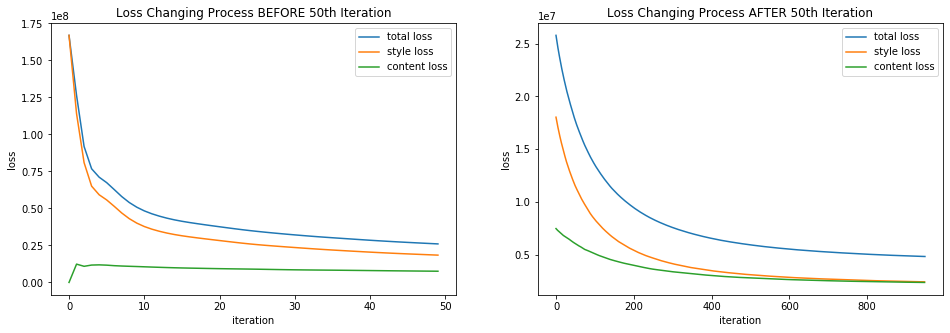

In [0]:
random.seed(2019)
best22, best_loss22 = run_style_transfer(content2_path, style2_path, content_weight=1e4, style_weight = 1e-2,
                                         init_image_content=True, num_iterations=1000)

In [0]:
best_loss22

<tf.Tensor: id=4983860, shape=(), dtype=float32, numpy=4854071.5>

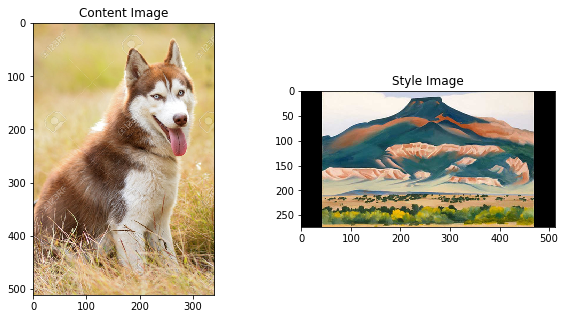

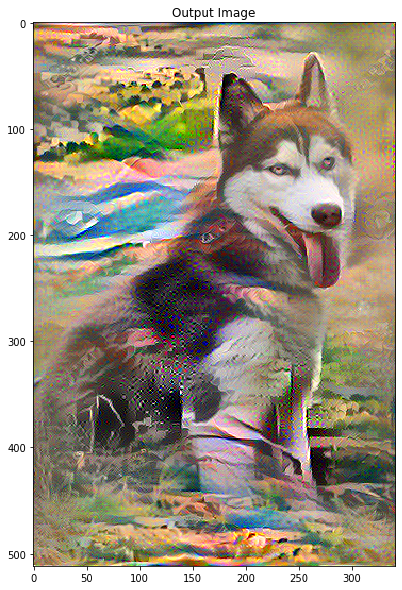

In [0]:
show_results(best22, content2_path, style2_path)

# Test the algorithm on Content3-Style1

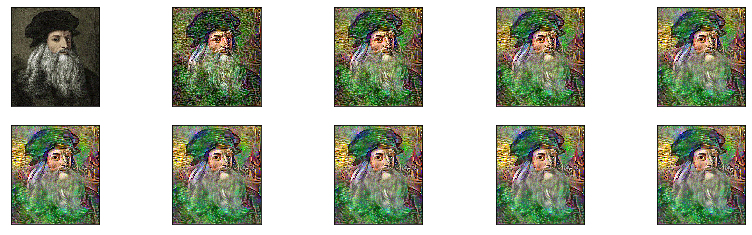

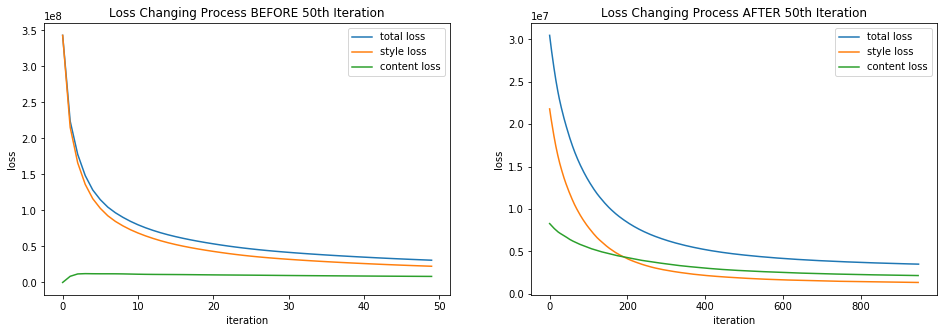

In [0]:
random.seed(2019)
best31, best_loss31 = run_style_transfer(content3_path, style1_path, content_weight=1e4, style_weight = 1e-2,
                                         init_image_content=True, num_iterations=1000)

In [0]:
best_loss31

<tf.Tensor: id=5634234, shape=(), dtype=float32, numpy=3501859.5>

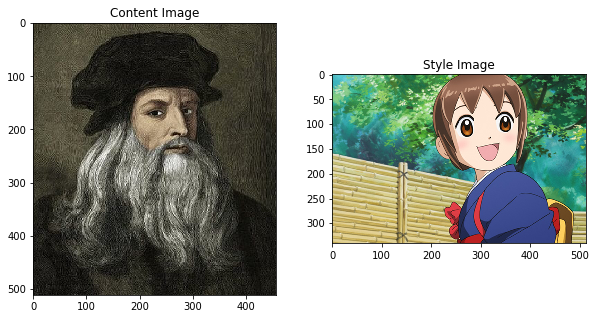

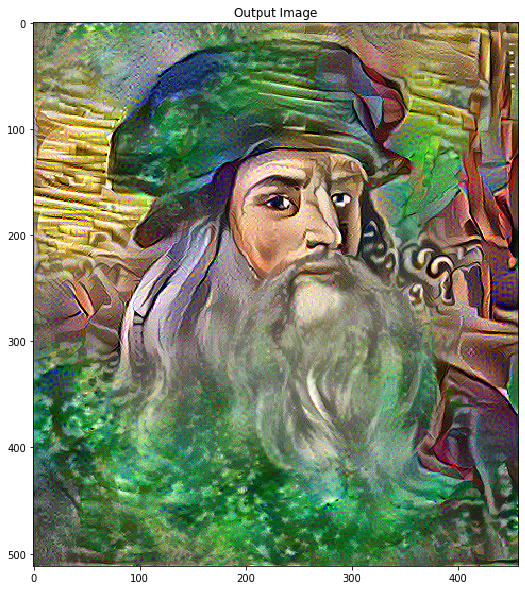

In [0]:
show_results(best31, content3_path, style1_path)

# Test the algorithm on Content3-Style2

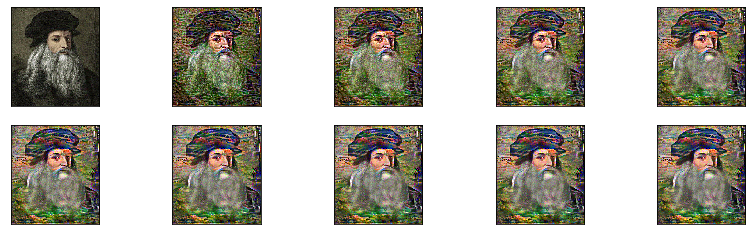

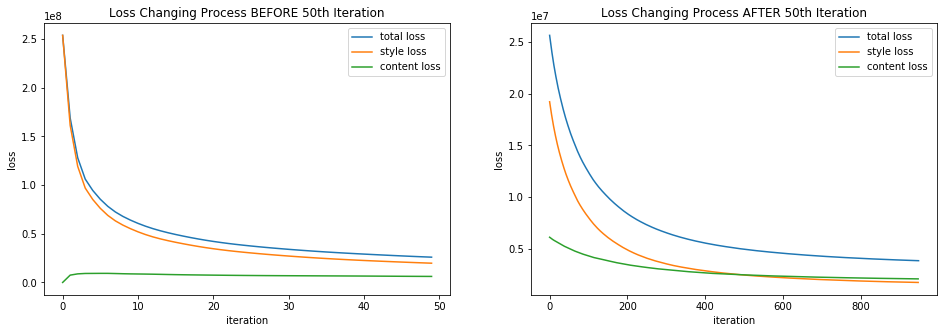

In [0]:
random.seed(2019)
best32, best_loss32 = run_style_transfer(content3_path, style2_path, content_weight=1e4, style_weight = 1e-2,
                                         init_image_content=True, num_iterations=1000)

In [0]:
best_loss32

<tf.Tensor: id=6284608, shape=(), dtype=float32, numpy=3860180.0>

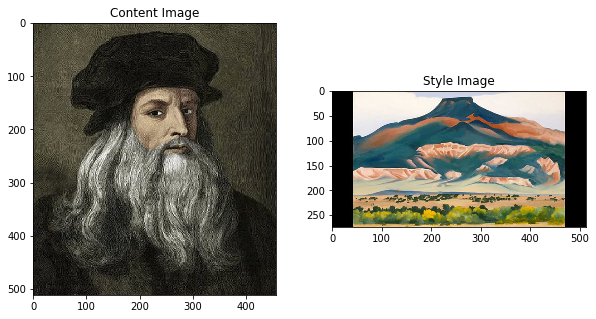

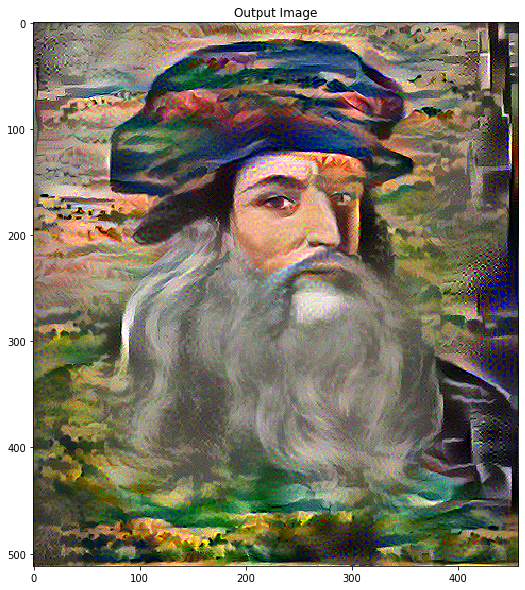

In [0]:
show_results(best32, content3_path, style2_path)